In [1]:
import os
import sys
from basicmemnet import memnet
from basicmemnet import plot_graph


A module that was compiled using NumPy 1.x cannot be run in
NumPy 2.0.0 as it may crash. To support both 1.x and 2.x
versions of NumPy, modules must be compiled with NumPy 2.0.
Some module may need to rebuild instead e.g. with 'pybind11>=2.12'.

If you are a user of the module, the easiest solution will be to
downgrade to 'numpy<2' or try to upgrade the affected module.
We expect that some modules will need time to support NumPy 2.

Traceback (most recent call last):  File "c:\Users\maria\anaconda3\lib\runpy.py", line 197, in _run_module_as_main
    return _run_code(code, main_globals, None,
  File "c:\Users\maria\anaconda3\lib\runpy.py", line 87, in _run_code
    exec(code, run_globals)
  File "c:\Users\maria\anaconda3\lib\site-packages\ipykernel_launcher.py", line 17, in <module>
    app.launch_new_instance()
  File "c:\Users\maria\anaconda3\lib\site-packages\traitlets\config\application.py", line 846, in launch_instance
    app.start()
  File "c:\Users\maria\anaconda3\lib\site-pack

AttributeError: _ARRAY_API not found

ImportError: numpy.core.multiarray failed to import

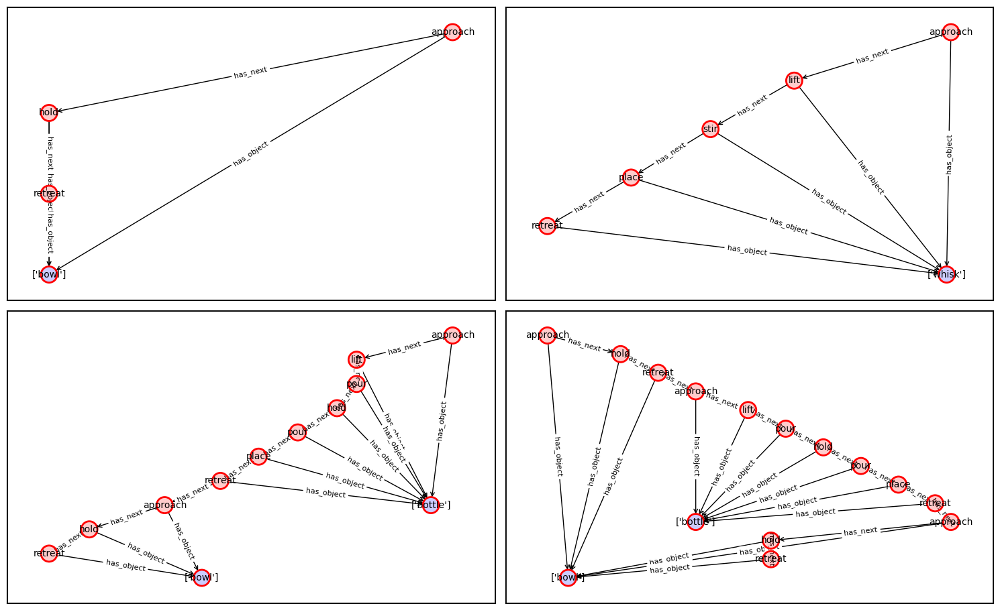

In [8]:
md = memnet.DSL(
    use_wordnet=False,
    json_file=os.path.join(sys.path[0], "action_patterns_sample.json"),
)

pg = plot_graph.PlotGraph()

sub_graphs = md.get_stm_actions(action_attributes={"utterances": ["approach"]})

pg.plot(sub_graphs)

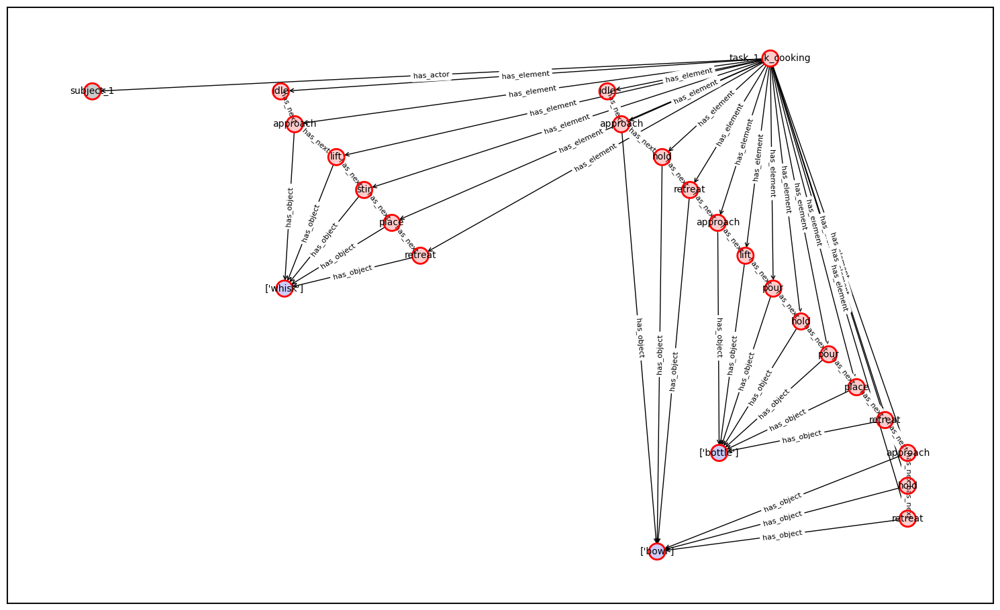

In [11]:
pg = plot_graph.PlotGraph()

sub_graphs = md.get_stm_actions(action_attributes={"utterances": ["task_1_k_cooking"]})

pg.plot(sub_graphs)

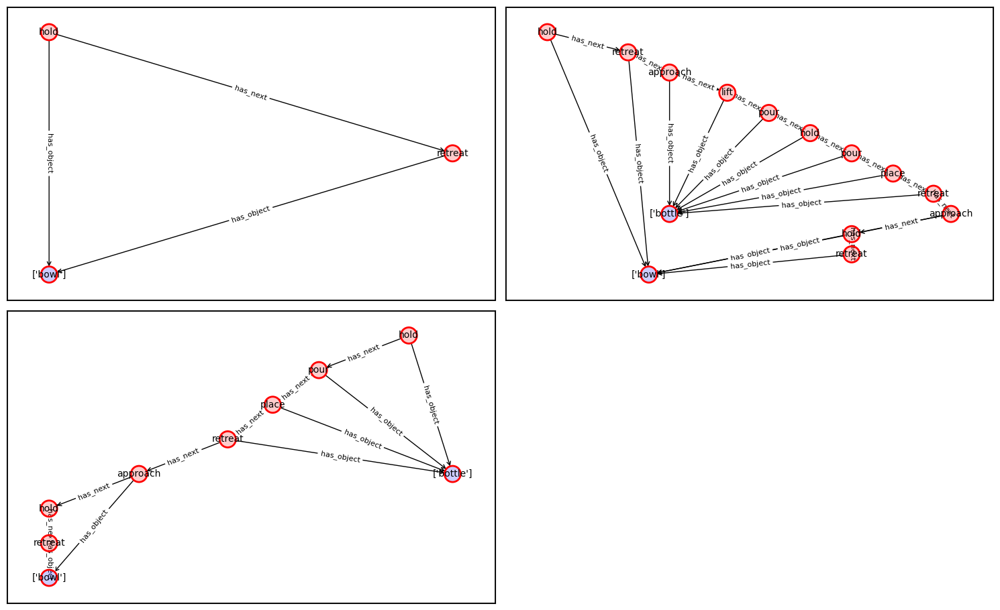

In [10]:
pg = plot_graph.PlotGraph()

sub_graphs = md.get_stm_actions(action_attributes={"utterances": ["hold"]})

pg.plot(sub_graphs)

In [2]:
md = memnet.DSL(
    use_wordnet=True,
    json_file=os.path.join(sys.path[0], "complete_action_patterns.json")
)
md.export_gml("complete_action_patterns_with_wordnet.gml")

[nltk_data] Downloading package wordnet to c:\Users\maria\Downloads\MA
[nltk_data]     _Thesis\Knowledge_Refinement_1\data...


loading c:\Users\maria\Downloads\MA_Thesis\Knowledge_Refinement_1\complete_action_patterns.json ...
loading finished


In [3]:
md = memnet.DSL(
    use_wordnet=True,
    json_file=os.path.join(sys.path[0], "test_graph.json")
)
md.export_gml("test_with_wordnet.gml")

[nltk_data] Error loading wordnet: <urlopen error [Errno 11001]
[nltk_data]     getaddrinfo failed>


loading c:\Users\maria\Downloads\MA_Thesis\Knowledge_Refinement_1\test_graph.json ...
loading finished


In [4]:
md = memnet.DSL(
    use_wordnet=True,
    json_file=os.path.join(sys.path[0], "train_graph.json")
)
md.export_gml("train_with_wordnet.gml")

[nltk_data] Error loading wordnet: <urlopen error [Errno 11001]
[nltk_data]     getaddrinfo failed>


loading c:\Users\maria\Downloads\MA_Thesis\Knowledge_Refinement_1\train_graph.json ...
loading finished


In [3]:
# md = memnet.DSL(
#     use_wordnet=False,
#     json_file=os.path.join(sys.path[0], "test_graph.json")
# )
# md.export_gml("test_graph.gml")
md = memnet.DSL(
    use_wordnet=False,
    json_file=os.path.join(sys.path[0], "train_graph.json")
)
md.export_gml("train_graph.gml")

loading c:\Users\maria\Downloads\MA_Thesis\Knowledge_Refinement_1\train_graph.json ...
loading finished


In [18]:
from node2vec import Node2Vec

node2vec = Node2Vec(graph, dimensions=64, walk_length=30, num_walks=200, workers=4)
model = node2vec.fit(window=10, min_count=1, batch_words=4)
embeddings = {node: model.wv[node] for node in graph.nodes()}

Computing transition probabilities:   0%|          | 0/2840 [00:00<?, ?it/s]

In [ ]:
import torch
import torch.nn.functional as F
from torch_geometric.nn import GCNConv
from torch_geometric.data import Data

# Create PyTorch geometric data
edge_index = torch.tensor(list(G.edges), dtype=torch.long).t().contiguous()
x = torch.tensor([embeddings[node] for node in G.nodes], dtype=torch.float)

data = Data(x=x, edge_index=edge_index)

# Define the GCN model
class GCN(torch.nn.Module):
    def __init__(self):
        super(GCN, self).__init__()
        self.conv1 = GCNConv(64, 128)
        self.conv2 = GCNConv(128, 64)


In [2]:
md = memnet.DSL()
md.import_gml("complete_action_patterns_with_wordnet.gml")

graph = md.get_graph()

In [3]:
import networkx as nx
import numpy as np

def calculate_graph_statistics(G):
    stats = {}
    
    # Basic Graph Statistics
    stats['number_of_nodes'] = G.number_of_nodes()
    stats['number_of_edges'] = G.number_of_edges()
    stats['density'] = nx.density(G)
    
    # Degree Measures
    in_degrees = dict(G.in_degree())
    out_degrees = dict(G.out_degree())
    stats['in_degree_distribution'] = in_degrees
    stats['out_degree_distribution'] = out_degrees
    stats['average_in_degree'] = np.mean(list(in_degrees.values()))
    stats['average_out_degree'] = np.mean(list(out_degrees.values()))
    stats['max_in_degree'] = max(in_degrees.values())
    stats['max_out_degree'] = max(out_degrees.values())
    
    # Path-Based Measures
    try:
        stats['diameter'] = nx.diameter(G)
    except nx.NetworkXError:
        stats['diameter'] = float('inf')  # Graph is not strongly connected
    
    #stats['average_shortest_path_length'] = nx.average_shortest_path_length(G)
    if nx.is_strongly_connected(G):
        stats['average_shortest_path_length'] = nx.average_shortest_path_length(G)
    else:
        lengths = []
        for component in nx.strongly_connected_components(G):
            subgraph = G.subgraph(component)
            if len(subgraph) > 1:
                lengths.append(nx.average_shortest_path_length(subgraph))
        if lengths:
            stats['average_shortest_path_length'] = np.mean(lengths)
        else:
            stats['average_shortest_path_length'] = float('inf')

    # Connectivity Measures
    stats['number_of_strongly_connected_components'] = nx.number_strongly_connected_components(G)
    stats['number_of_weakly_connected_components'] = nx.number_weakly_connected_components(G)
    
    # Centrality Measures
    stats['betweenness_centrality'] = nx.betweenness_centrality(G)
    stats['closeness_centrality'] = nx.closeness_centrality(G)
    
    # Clustering Measures
    stats['clustering_coefficient'] = nx.clustering(G)
    stats['average_clustering_coefficient'] = nx.average_clustering(G)
    
    # Assortativity
    stats['degree_assortativity_coefficient'] = nx.degree_assortativity_coefficient(G)
    
    # Reciprocity
    stats['reciprocity'] = nx.reciprocity(G)
    
    return stats


In [18]:
# Basic Graph Statistics: Number of nodes, number of edges, and density.
# Degree Measures: In-degree and out-degree distributions, average in-degree, average out-degree, maximum in-degree, and maximum out-degree.
# Path-Based Measures: Diameter and average shortest path length.
# Connectivity Measures: Number of strongly and weakly connected components.
# Centrality Measures: Betweenness centrality, closeness centrality, and eigenvector centrality.
# Clustering Measures: Clustering coefficient and average clustering coefficient.
# Assortativity: Degree assortativity coefficient.
# Reciprocity: Reciprocity of the graph.

In [4]:
stats = calculate_graph_statistics(graph)
for stat, value in stats.items():
    print(f"{stat}: {value}")

number_of_nodes: 109810
number_of_edges: 121666
density: 1.008995900970946e-05
in_degree_distribution: {'669832a88cc61c24682a3e13': 0, '669832a88cc61c24682a3e14': 1, '669832a88cc61c24682a3e15': 1, '669832a88cc61c24682a3e16': 1, '669832a88cc61c24682a3e17': 1, '669832a88cc61c24682a3e18': 1, '669832a88cc61c24682a3e19': 1, '669832a88cc61c24682a3e1a': 1, '669832a88cc61c24682a3e1b': 1, '669832a88cc61c24682a3e1c': 1, '669832a88cc61c24682a3e1d': 1, '669832a88cc61c24682a3e1e': 1, '669832a88cc61c24682a3e1f': 1, '669832a88cc61c24682a3e20': 1, '669832a88cc61c24682a3e21': 1, '669832a88cc61c24682a3e22': 1, '669832a88cc61c24682a3e23': 1, '669832a88cc61c24682a3e24': 2, '669832a88cc61c24682a3e25': 1, '669832a88cc61c24682a3e26': 1, '669832a88cc61c24682a3e27': 1, '669832a88cc61c24682a3e28': 1, '669832a88cc61c24682a3e29': 2, '669832a88cc61c24682a3e2a': 1, '669832a88cc61c24682a3e2b': 1, '669832a88cc61c24682a3e2c': 1, '669832a88cc61c24682a3e2d': 1, '669832a88cc61c24682a3e2e': 1, '669832a88cc61c24682a3e2f': 

In [29]:
import pandas as pd

<Axes: >

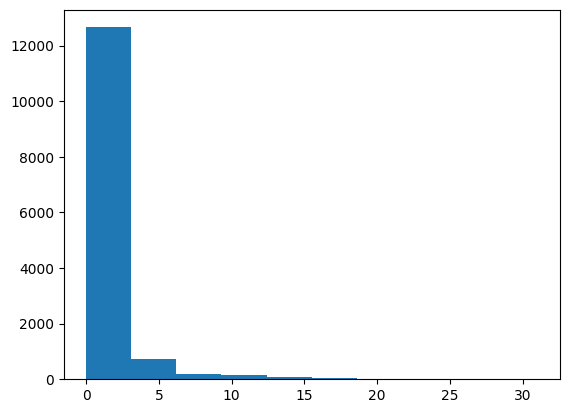

In [54]:
pd.Series(stats['in_degree_distribution'].values()).hist(grid=False)

<Axes: >

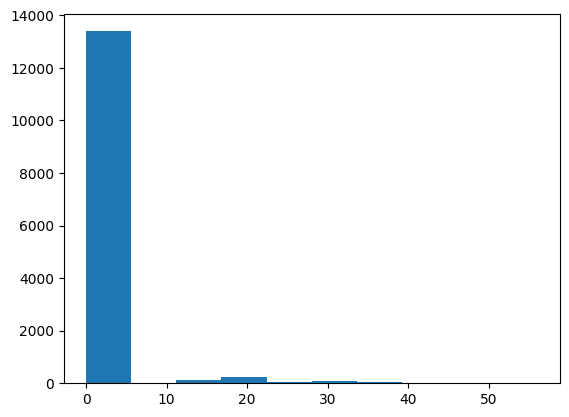

In [48]:
pd.Series(stats['out_degree_distribution'].values()).hist(grid=False)

In [46]:
import networkx as nx
import matplotlib.pyplot as plt
from collections import Counter

def additional_graph_statistics(G):
    stats = {}

    # Action Frequency
    actions = [data['utterances'][0] for node, data in G.nodes(data=True) if data['type'] == 'action']
    action_freq = Counter(actions)
    stats['action_frequency'] = action_freq

    # Temporal Dynamics (assuming edges have timestamps)
    durations = []
    for node, data in G.nodes(data=True):
        if 'duration' in data:
            durations.append(data['duration'])
    stats['average_time_interval'] = np.mean(durations)

    return stats


# Calculate additional statistics
additional_stats = additional_graph_statistics(graph[0])
for stat, value in additional_stats.items():
    print(f"{stat}: {value}")


action_frequency: Counter({'approach': 2562, 'retreat': 2517, 'lift': 1443, 'place': 1372, 'hold': 1217, 'idle': 1207, 'pour': 357, 'screw': 288, 'stir': 122, 'hammer': 115, 'task_1_k_cooking': 60, 'task_2_k_cooking_with_bowls': 60, 'task_3_k_pouring': 60, 'drink': 60, 'task_4_k_wiping': 60, 'wipe': 60, 'task_5_k_cereals': 60, 'cut': 60, 'task_6_w_hard_drive': 60, 'task_7_w_free_hard_drive': 60, 'task_8_w_hammering': 60, 'task_9_w_sawing': 60, 'saw': 57, None: 1})
average_time_interval: 1.3044238503234833


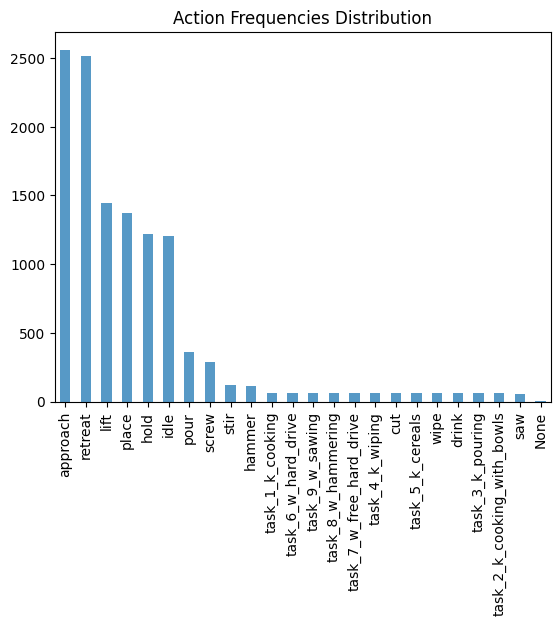

In [66]:
freq = pd.Series(additional_stats['action_frequency']).sort_values(ascending=False)
freq.plot(kind='bar',alpha=0.75, rot=0)
plt.xticks(rotation=90)
plt.title("Action Frequencies Distribution")
plt.show()

In [ ]:
pip install mlxtend

In [ ]:
import networkx as nx
from mlxtend.preprocessing import TransactionEncoder
from mlxtend.frequent_patterns import fpgrowth, association_rules

def extract_action_sequences(G):
    # Extract action sequences for each subject
    subjects = set(data['subject'] for _, data in G.nodes(data=True) if 'subject' in data)
    subject_action_sequences = {subject: [] for subject in subjects}
    
    for node, data in G.nodes(data=True):
        if 'subject' in data:
            subject_action_sequences[data['subject']].append(data['action'])

    # Convert to list of lists format
    sequences = list(subject_action_sequences.values())
    return sequences

def find_frequent_sequences(sequences, min_support=0.5):
    te = TransactionEncoder()
    te_ary = te.fit(sequences).transform(sequences, sparse=True)
    df = pd.DataFrame.sparse.from_spmatrix(te_ary, columns=te.columns_)
    
    frequent_itemsets = fpgrowth(df, min_support=min_support, use_colnames=True)
    rules = association_rules(frequent_itemsets, metric="confidence", min_threshold=0.7)
    
    return frequent_itemsets, rules

# Example usage
G = nx.DiGraph()
# Add nodes and edges with attributes to G
# G.add_node(node, action='action1', subject='subject1')
# G.add_edge(u, v, timestamp=1)

# Extract sequences
sequences = extract_action_sequences(G)

# Find frequent sequences
frequent_itemsets, rules = find_frequent_sequences(sequences, min_support=0.1)
print(frequent_itemsets)
print(rules)
